In [1]:
import Pkg
# Pkg.activate("./dibs_env")
Pkg.activate("/uufs/chpc.utah.edu/common/home/sdss50/sdsswork/users/u6048534/dibs_env")
ENV["PYTHON"]=""
Pkg.build("PyCall")

  Activating project at `/uufs/chpc.utah.edu/common/home/sdss50/sdsswork/users/u6048534/dibs_env`
    Building Conda ─→ `/uufs/chpc.utah.edu/common/home/sdss50/sdsswork/users/u6048534/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/6e47d11ea2776bc5627421d59cdcc1296c058071/build.log`
    Building PyCall → `/uufs/chpc.utah.edu/common/home/sdss50/sdsswork/users/u6048534/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/53b8b07b721b77144a0fbbbc2675222ebf40a02d/build.log`


In [44]:
using PyPlot, Plots

LoadError: ArgumentError: Package Plots not found in current path.
- Run `import Pkg; Pkg.add("Plots")` to install the Plots package.

In [45]:
install_run = true
if install_run
    using Pkg
    Pkg.add(["Glob","FITSIO","Serialization", "HDF5", "DelimitedFiles"])
    Pkg.add(["StatsBase","Distributions","FreqTables", "LsqFit"])
    Pkg.add(["BinnedStatistics","KrylovKit","ImageTransformations"])
    Pkg.add(["DataFrames", "ProgressMeter", "Distributed", "BenchmarkTools"])
    Pkg.add(["Healpix", "SkyCoords", "WCS"])
    Pkg.add(["LaTeXStrings", "Formatting", "Printf", "PyFormattedStrings"])
    Pkg.add(["Conda","PyCall","PyPlot", "Plots"])
end

#File Handling
using Glob, FITSIO, Serialization, HDF5, DelimitedFiles
# Stats
using StatsBase, LinearAlgebra, Distributions, FreqTables, LsqFit 
using BinnedStatistics, KrylovKit, ImageTransformations
# Computing
using DataFrames, ProgressMeter, Distributed, BenchmarkTools, Random
# Astro
using Healpix, SkyCoords, WCS
# Python Plotting Setup
using PyCall, LaTeXStrings, Formatting, Printf, PyFormattedStrings
import PyPlot; const plt = PyPlot
mpltk=pyimport("mpl_toolkits.axes_grid1")
patches=pyimport("matplotlib.patches")
mplcolors=pyimport("matplotlib.colors")
mplani = pyimport("matplotlib.animation");
cc=pyimport("colorcet")
pyimport("sys")."stdout" = PyTextIO(stdout)
pyimport("sys")."stderr" = PyTextIO(stderr);
#py"""
#from scipy.stats import binned_statistic_2d
#"""
plt.matplotlib.style.use("default")

   Resolving package versions...
  No Changes to `/uufs/chpc.utah.edu/common/home/sdss50/sdsswork/users/u6048534/dibs_env/Project.toml`
  No Changes to `/uufs/chpc.utah.edu/common/home/sdss50/sdsswork/users/u6048534/dibs_env/Manifest.toml`
   Resolving package versions...
  No Changes to `/uufs/chpc.utah.edu/common/home/sdss50/sdsswork/users/u6048534/dibs_env/Project.toml`
  No Changes to `/uufs/chpc.utah.edu/common/home/sdss50/sdsswork/users/u6048534/dibs_env/Manifest.toml`
   Resolving package versions...
  No Changes to `/uufs/chpc.utah.edu/common/home/sdss50/sdsswork/users/u6048534/dibs_env/Project.toml`
  No Changes to `/uufs/chpc.utah.edu/common/home/sdss50/sdsswork/users/u6048534/dibs_env/Manifest.toml`
   Resolving package versions...
  No Changes to `/uufs/chpc.utah.edu/common/home/sdss50/sdsswork/users/u6048534/dibs_env/Project.toml`
  No Changes to `/uufs/chpc.utah.edu/common/home/sdss50/sdsswork/users/u6048534/dibs_env/Manifest.toml`
   Resolving package versions...
  No Ch

In [4]:
andrew_dir = "/uufs/chpc.utah.edu/common/home/u6039752/scratch/zenodo/GaiaDIB/GaiaDIB_dat/"

star_msk, nansum = deserialize(andrew_dir*"priors/star_mask.jdat");
SNR_lst = h5read(andrew_dir*"priors/SNR_lst.h5","SNR_lst");
sig_noise = deserialize(andrew_dir*"priors/sig_noise.jdl")

delthres = 1.46
noisefact = 3.6;
chi2perdof = 0.15
covdet = h5read(andrew_dir*"priors/precomp_dust_2_analyticDeriv.h5","covdet")
covdet0 = median(covdet)

c = 299792.458; # in km/s
cwave = 8623.14
cwave_cent = 8623.47 # this was the center of the scan, not the actual cwave
mu0, sig0 = 1.85, 0.5
mu1, sig1 = 8623.47, 1

srng = -100:0.1:100
sigrng = 0.4:0.01:4;

xmin0 = 8460
xmax0 = 8700
wavex = xmin0:0.1:xmax0
maxw = maximum(wavex[star_msk])
minw = minimum(wavex[star_msk])

waveknown = [8618.647, 8619.457, 8620.792, 8623.969];
labknown =["FeI]", "SI", "TiI", "FeI"]
waveadd = [8620.508, 8622.438]
labadd = ["FeI", "NiI"]
wavebad = [8617.75, 8621.62, 8625.236, 8627.73]
labbad = ["CaI", "CaI]","FeI]","TiIII"]
wavelst = [waveknown, waveadd, wavebad, cwave]
lablst = [labknown, labadd, labbad,["DIB"]]
wavecolor = ["turquoise", "turquoise", "magenta", "black"];

In [5]:
cmap_wb = plt.cm.get_cmap("cet_CET_L16_r",512)
cmap_wb.set_bad(color=(0.7,0.7,0.7))

cmap_wb_u = plt.cm.get_cmap("cet_CET_L16_r",512)
cmap_wb_u.set_bad(color=(0.7,0.7,0.7))
cmap_wb_u.set_under(color=(0.7,0.7,0.7))

cmap_bwr = plt.cm.get_cmap("cet_CET_D1A",512)
cmap_bwr.set_bad(color=(0.7,0.7,0.7))

cmap_bwrg = plt.cm.get_cmap("cet_CET_D1",512)
cmap_bwrg.set_bad(color=(0.7,0.7,0.7))
cmap_bwrg.set_under(color=(0.5,0.8,0.5))
cmap_bwrg.set_over(color=(0.4,0.4,0.4))

cmap_exp = plt.cm.get_cmap("cet_CET_L12_r",512)
cmap_exp.set_bad(color=(0.6,0.6,0.6))

py"""
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np

def truncate_colormap(cmap_text, minval=0.0, maxval=1.0, n=100):
    cmap = (plt.get_cmap(cmap_text,512)).copy()
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap
"""

trunc_cmap_L6 = py"truncate_colormap('cet_CET_L6', 0.8, 0.0)"
trunc_warm_cmap = py"truncate_colormap('cet_CET_L8', 0.1, 0.9)";

py"""
import numpy as np
import matplotlib.colors as mcolors
colors = plt.cm.get_cmap("cet_CET_L6",512)(np.linspace(0.9,0.5,256))
colors = np.append(colors,plt.cm.get_cmap("cet_CET_L4",512)(np.linspace(0.5,0,256)),axis=0)
cmap_split = mcolors.LinearSegmentedColormap.from_list('mycmap', colors, N=512)
"""
cmap_split = py"cmap_split"

py"""
import numpy as np
import matplotlib.colors as mcolors 
colors = [(0,0,0,0) for c in np.linspace(0,0.5,100)]
cmap_test = mcolors.LinearSegmentedColormap.from_list('mycmap', colors, N=100)
"""
cmap_test = py"cmap_test";

cmap_test.set_bad(color=(0.7,0.7,0.7))
cmap_test.set_under(color=(0.5,0.8,0.5))
cmap_test.set_over(color=(0.4,0.4,0.4));

In [6]:
function colat_long_rad(glonin,glatin)
    return π/2 .- deg2rad(glatin), deg2rad(glonin)
end

function project_VLSR(u,v,w; rGVLSR = (10.6,10.7,7.6))
    return dot(rGVLSR,[u,v,w])
end

function trans(x)
    if x>180
        return x-360
    else
        return x
    end
end

fiqr(x) = iqr(x)./1.34896;

In [7]:
# MADGICS Catalog
f = h5open(andrew_dir*"dib_explore_v14.h5");
glon = read(f["glon"])
glat = read(f["glat"]);

U = read(f["U"])
V = read(f["V"])
W = read(f["W"])

X = read(f["X"])
Y = read(f["Y"])

ew = read(f["ew"])
ew_err = read(f["ew_err"])

lam = read(f["lam"])
lam_err = read(f["lam_err"]);

vdust = read(f["v_dust_lsr"]);
v_dust_lsr_COframe = read(f["v_dust_lsr_COframe"])
v_dust_lsr_err = read(f["v_dust_lsr_err"]);
v_star_bary = read(f["v_star_bary"])
v_star_bary_error = read(f["v_star_bary_error"])

sig = read(f["sig"])
sig_err = read(f["sig_err"]);

dib_snr = read(f["dib_snr"])
stellar_snr = read(f["stellar_snr"])

d_pc = read(f["r_med_geo"])
dkpc = d_pc./1000
r_lo_geo = read(f["r_lo_geo"])
r_hi_geo = read(f["r_hi_geo"]);

bayestar19 = read(f["bayestar19"])
close(f)

glon_trans = trans.(glon);

In [8]:
py"""
from dustmaps.config import config
config.reset()
"""

In [9]:
# basework = "/uufs/chpc.utah.edu/common/home/u6039752/scratch/working/" # andrew's working directory
# ## Total number of stars
# grvs = h5open(basework*"2022_11_28/sources/gaia_rvs.h5");
# println(size(grvs["flux"],2))
# close(grvs)

In [19]:
f = FITS(andrew_dir*"gaia_archive_results/RVS_astro-result.fits.gz")
RVS_source_id = read(f[2],"source_id")
ps = sortperm(RVS_source_id);
flags_gspspec = read(f[2],"flags_gspspec")[ps];
teff = read(f[2],"teff_gspspec")[ps]
logg = read(f[2],"logg_gspspec")[ps]
mh = read(f[2],"mh_gspspec")[ps]
close(f)

grvs = h5open(andrew_dir*"sources/gaia_rvs_lite.h5");
grvs_id = read(grvs["SOURCE_ID"]);
glon_rvs = read(grvs["GLON"]);
glat_rvs = read(grvs["GLAT"]);
# glat_teff = read(grvs["T_EFF"]);
close(grvs)

py"""
from astropy.coordinates import SkyCoord
import astropy.units as units
from dustmaps.sfd import SFDWebQuery
sfd = SFDWebQuery()
l = $glon_rvs
b = $glat_rvs
coords = SkyCoord(l*units.deg, b*units.deg, frame='galactic')
sfd_reddening = sfd(coords)
"""

sfd_red = 1 .* py"sfd_reddening";

In [21]:
size(teff[msk_inter])

(65186,)

In [47]:
grvs

🗂️ HDF5.File: (read-only) /uufs/chpc.utah.edu/common/home/u6039752/scratch/zenodo/GaiaDIB/GaiaDIB_dat/sources/gaia_rvs_lite.h5
├─ 🔢 GLAT
├─ 🔢 GLON
└─ 🔢 SOURCE_ID

In [11]:
basework = "/uufs/chpc.utah.edu/common/home/u6039752/scratch/working/"

fluxes = h5read(basework*"2022_11_28/sources/gaia_rvs.h5", "flux");
dfluxes = h5read(basework*"2022_11_28/sources/gaia_rvs.h5", "dflux");

In [48]:
h5open(basework*"2022_11_28/sources/gaia_rvs.h5")

🗂️ HDF5.File: (read-only) /uufs/chpc.utah.edu/common/home/u6039752/scratch/working/2022_11_28/sources/gaia_rvs.h5
├─ 🔢 COMBINED_CCDS
├─ 🔢 COMBINED_TRANSITS
├─ 🔢 DEBLENDED_CCDS
├─ 🔢 DEC
├─ 🔢 GLAT
├─ 🔢 GLON
├─ 🔢 RA
├─ 🔢 SOLUTION_ID
├─ 🔢 SOURCE_ID
├─ 🔢 dflux
└─ 🔢 flux

In [35]:
size(fluxes)

(2401, 999645)

In [23]:
masked_fluxes = fluxes[star_msk,msk_inter][:,ps1];
masked_dfluxes = dfluxes[star_msk,msk_inter][:,ps1];
masked_teffs = teff[msk_inter][ps1];

In [16]:
size(masked_fluxes)

(2189, 65186)

In [17]:
size(masked_fluxes[2*10000])

()

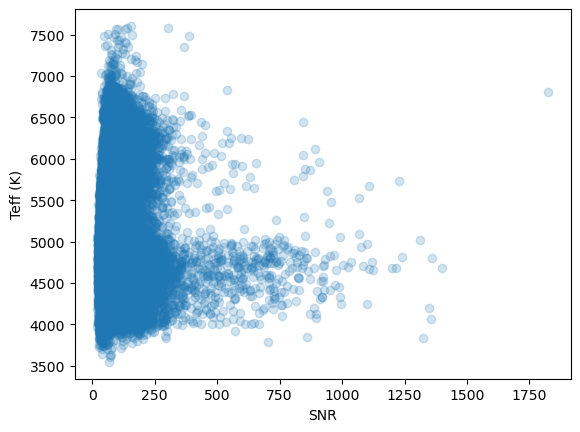

PyObject Text(24.0, 0.5, 'Teff (K)')

In [71]:
scatter(SNR_lst[msk_inter][ps1], masked_teffs, alpha=0.2)
xlabel("SNR")
ylabel("Teff (K)")

In [47]:
pyplot() 

LoadError: UndefVarError: pyplot not defined

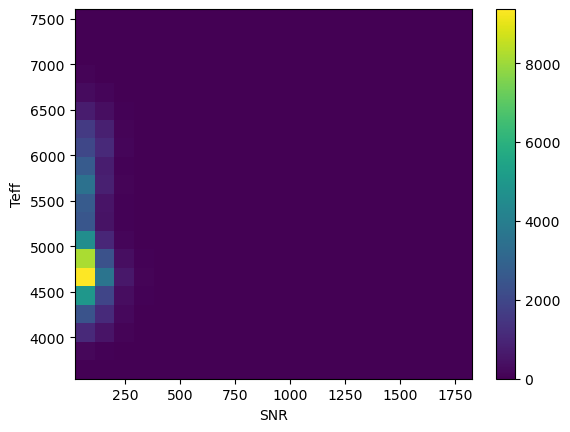

PyObject Text(24.0, 0.5, 'Teff')

In [63]:
plt.hist2D(SNR_lst[msk_inter][ps1], masked_teffs, bins=20)
plt.colorbar()
plt.xlabel("SNR")
plt.ylabel("Teff")

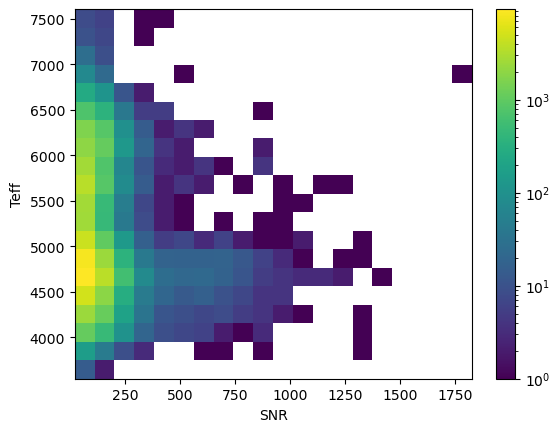

PyObject Text(24.0, 0.5, 'Teff')

In [97]:
plt.hist2D(SNR_lst[msk_inter][ps1], masked_teffs, bins=20, norm = mplcolors.LogNorm())
plt.colorbar()
plt.xlabel("SNR")
plt.ylabel("Teff")

reference should be 10^2

do a teff cut around 5250 K (high temp/low temp bin)

low temp/10^2 bin should be reference

binstats

binned_statistic_2d

use the 20,000 lowest SNR stars to make a template, take cross-correlation (dot product) with each star

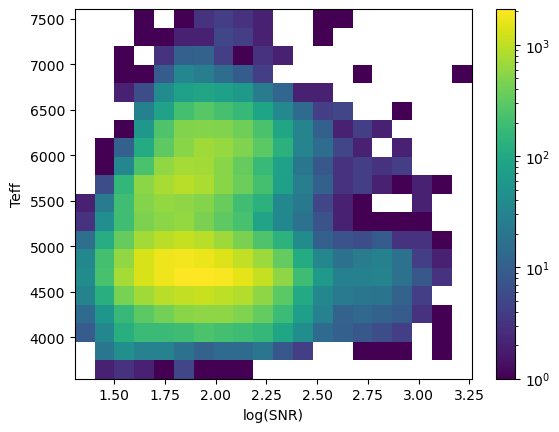

PyObject Text(24.0, 0.5, 'Teff')

In [78]:
plt.hist2D(log10.(SNR_lst[msk_inter][ps1]), masked_teffs, bins=20, norm = mplcolors.LogNorm())
plt.colorbar()
plt.xlabel("log(SNR)")
plt.ylabel("Teff")

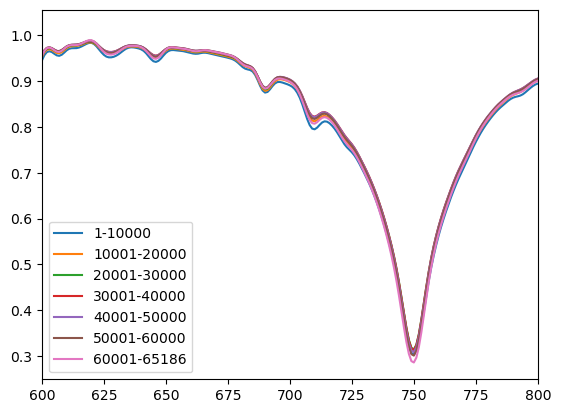

PyObject <matplotlib.legend.Legend object at 0x14f7c934dfc0>

In [18]:
for i in 1:6
    plot(mean(masked_fluxes[:,(i-1)*10000+1:i*10000], dims=2), label = string(10000*(i-1)+1)*"-"* string(i*10000))
end
plot(mean(masked_fluxes[:,60000:end], dims=2), label = "60001-65186")
# plot([750,750],[-0.025,0.025])

xlim(600,800)
legend()

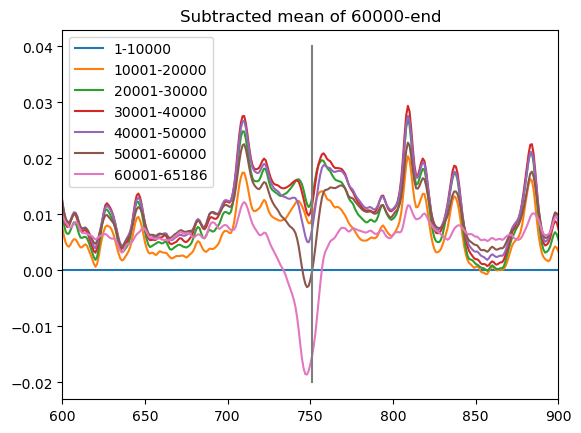

PyObject <matplotlib.legend.Legend object at 0x14f7c86ea0b0>

In [108]:
last_mean = mean(masked_fluxes[:,1:10_000], dims=2)
for i in 1:6
    plot(mean(masked_fluxes[:,(i-1)*10000+1:i*10000] .- last_mean, dims=2), label = string(10000*(i-1)+1)*"-"* string(i*10000))
end
plot(mean(masked_fluxes[:,60000:end], dims=2).- last_mean, label = "60001-65186")
plot([751,751],[-0.02,0.04])
title("Subtracted mean of 60000-end")

xlim(600,900)
legend()

In [127]:
size(last_mean)

(2189, 1)

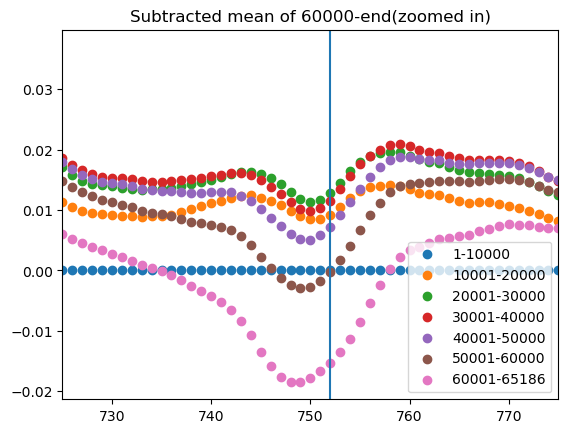

PyObject <matplotlib.legend.Legend object at 0x14f7c502fc40>

In [136]:
title("Subtracted mean of 60000-end(zoomed in)")

last_mean = mean(masked_fluxes[:,1:10_000], dims=2)
for i in 1:6
    plt.scatter(1:2189,mean(masked_fluxes[:,(i-1)*10000+1:i*10000] .- last_mean, dims=2), label = string(10000*(i-1)+1)*"-"* string(i*10000))
end
plt.scatter(1:2189, mean(masked_fluxes[:,60000:end], dims=2).- last_mean, label = "60001-65186")
# plt.scatter(1:2189, [751,751],[-0.04,0.04])
plt.axvline(752)

xlim(725,775)
legend()

27
751
751
751
751
750


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


750


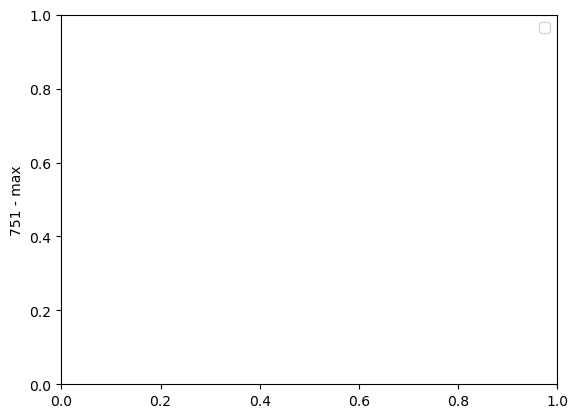

PyObject <matplotlib.legend.Legend object at 0x14f7c7edf7c0>

In [123]:
last_mean = mean(masked_fluxes[:,1:10_000], dims=2)
println(argmin(last_mean[725:775]))
for i in 2:6
    # plot(dropdims(mean(masked_fluxes[:,(i-1)*10000+1:i*10000], dims=2) .- last_mean,dims=2)[740:760])
    m = argmin(dropdims(mean(masked_fluxes[:,(i-1)*10000+1:i*10000], dims=2) .- last_mean,dims=2)[740:760])
    println(740 + m)
    # println(600+m)
    #[1] .- last_mean_index
    # plt.scatter(i, 752 - (725+m), label = string(10000*(i-1)+1)*"-"* string(i*10000))
end
# plot((mean(masked_fluxes[:,60000:end], dims=2).- last_mean)[740:760])
m = argmin(dropdims(mean(masked_fluxes[:,60000:end], dims=2) .- last_mean,dims=2)[740:760])
println(740 + m)


ylabel("751 - max")
legend()

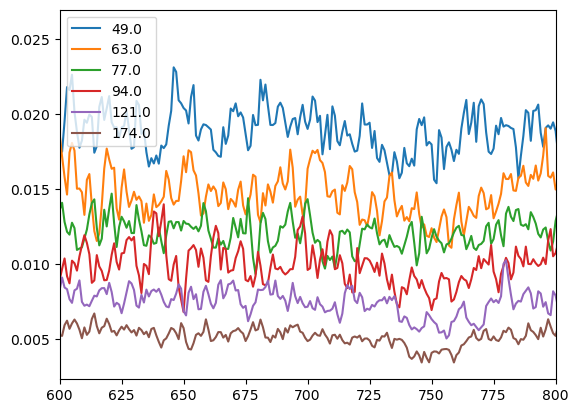

PyObject <matplotlib.legend.Legend object at 0x14b06fc8f310>

In [80]:
for i in 1:6
    plot(masked_dfluxes[:,i*10000], label = round(SNR_lst[msk_inter][ps1][i*10000]))
end
xlim(600,800)
legend()


In [66]:
h5open("test_gaia_data1.h5", "w") do file
    write(file, "flux", masked_fluxes[:,1:200])
    write(file, "dflux",masked_dfluxes[:,1:200])
end

In [67]:
h5open("test_gaia_data2.h5", "w") do file
    write(file, "flux", masked_fluxes[:,end-200:end])
    write(file, "dflux",masked_dfluxes[:,end-200:end])
end

In [68]:
h5open("test_gaia_data_circshift1.h5", "w") do file
    write(file, "flux", circshift(masked_fluxes[:,1:200],(1,0)))
    write(file, "dflux",circshift(masked_dfluxes[:,1:200],(1,0)))
end

In [69]:
h5open("test_gaia_data_circshift2.h5", "w") do file
    write(file, "flux", circshift(masked_fluxes[:,end-200:end],(1,0)))
    write(file, "dflux",circshift(masked_dfluxes[:,end-200:end],(1,0)))
end

In [60]:
grvs = h5open("test_gaia_data1.h5")
d = grvs["dflux"]

🔢 HDF5.Dataset: /dflux (file: test_gaia_data1.h5 xfer_mode: 0)

In [61]:
size(d)

(2401, 200)

In [63]:
size(d[:,40])

(2401,)

In [65]:
close(grvs)

In [45]:
h5write("test_gaia_data1.h5", "flux",masked_fluxes[1:200])
h5write("test_gaia_data1.h5", "flux",masked_fluxes[1:200])
h5write("test_gaia_data2.h5", "dflux",masked_dfluxes[end-200:end])
h5write("test_gaia_data2.h5", "dflux",masked_dfluxes[end-200:end])

LoadError: unable to determine if test_gaia_data1.h5 is accessible in the HDF5 format (file may not exist)

In [ ]:
si

In [1]:
size(grvs_id)

LoadError: UndefVarError: grvs_id not defined

In [12]:
function mask_gspspec_flag(flagstring)
    good = true
    if length(flagstring)==41
        for i=1:13
            good &= (flagstring[i].=='0')
        end
        return good
    else
        good = false
        return good
    end
end

mask_gspspec_flag (generic function with 1 method)

In [13]:
msk_flags_gspspec = mask_gspspec_flag.(flags_gspspec);

msk_inter = nansum .& (sfd_red.<0.05) .& msk_flags_gspspec
count(msk_inter), count(msk_inter)/length(msk_inter)

(65186, 0.06520914924798303)

In [33]:
my_residuals  = h5read("../all_gaia_masked/all_files_in_order.h5", "residuals");
my_stellar_components = h5read("../all_gaia_masked/all_files_in_order.h5", "star_components");

In [34]:
my_residuals[:,end-13:end]

2401×14 Matrix{Float64}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 ⋮                        ⋮                        ⋮             

In [35]:
percent_residuals = 100 * my_residuals[star_msk,:] ./my_stellar_components[star_msk,:];

In [14]:
ps1 = sortperm(SNR_lst[msk_inter]);
size(ps1)

(65186,)

In [37]:
sorted_percent_residuals = percent_residuals[:,1:65186][:,ps1];
sorted_residuals = my_residuals[star_msk,1:65186][:,ps1];

In [38]:
size(sorted_percent_residuals)

(2189, 65186)

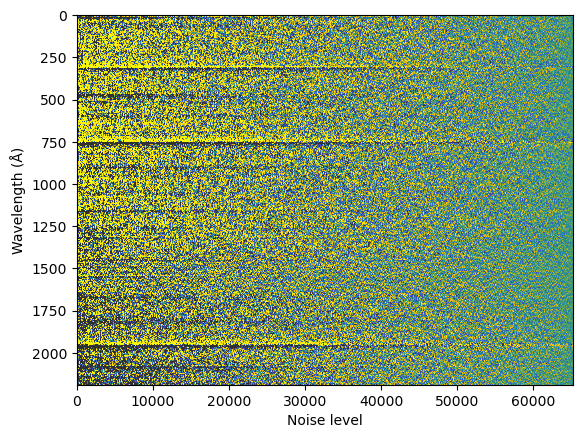

PyObject Text(25.953125, 0.5, 'Wavelength (Å)')

In [40]:
fig = plt.figure()
ax = fig.add_subplot(1,1,1)

img = ax.imshow(sorted_percent_residuals,
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-0.2,
    vmax=0.2,
    # extent=(minimum(noises), maximum(noises),maxw,minw),
    # extent=(0,size(sorted_residuals',2),maxw,minw),
)
plt.xlabel("Noise level")
plt.ylabel("Wavelength (Å)")

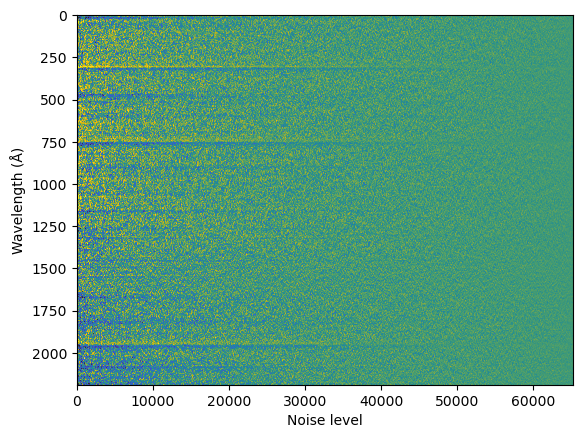

PyObject Text(25.953125, 0.5, 'Wavelength (Å)')

In [33]:
fig = plt.figure()
ax = fig.add_subplot(1,1,1)

img = ax.imshow(sorted_residuals,
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-0.01,
    vmax=0.01,
    # extent=(minimum(noises), maximum(noises),maxw,minw),
    # extent=(0,size(sorted_residuals',2),maxw,minw),
)
plt.xlabel("Noise level")
plt.ylabel("Wavelength (Å)")

In [13]:
open("msk_inter.jdat", "w") do file
    serialize(file, msk_inter)
end

In [15]:
arr = deserialize("msk_inter.jdat");

In [24]:
basework = "/uufs/chpc.utah.edu/common/home/u6039752/scratch/working/"
grvs = h5open(basework*"2022_11_28/sources/gaia_rvs.h5");
grvs["dflux"][:,2]

2401-element Vector{Float64}:
   0.08734671
   0.03126682
   0.025344355
   0.024289425
   0.027454004
   0.023624433
   0.024644965
   0.024512451
   0.021668775
   0.022856787
   0.021700295
   0.021122428
   0.022530217
   ⋮
   0.018825926
   0.017383512
   0.015256533
   0.017852081
   0.018546527
   0.020505156
   0.02234395
   0.022242872
   0.019019106
 NaN
 NaN
 NaN

In [22]:
grvs = h5open(andrew_dir*"sources/gaia_rvs_lite.h5");


LoadError: KeyError: key "dflux" not found

In [26]:
s

"\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0" ⋯ 124419 bytes ⋯ "\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0`\0\0̋\xac\0 \0 d \x80A\x10\x19\0\0\0\0\x001\x19+@<\x04m\x1eA\x80\x93\x85L@\x04\xa0\0\b\xf4\xe8\x0e\xe7(\xe8̬%#4!\0\x1c\x03N\x01\x10@\xa0\0\x04\xcc\n\x19\x04\0\0\0\0\0\x80\0\0\0\x000\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0@\x10\a\0\0X\x80\\hA\x02\e\x01\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\0\xb0\0\0\0\0\0\0\0\0\0\0\

In [21]:
size(msk_inter)

(999645,)

In [ ]:
read(

## Original Figure

In [14]:
size(msk_inter), size(SNR_lst), sum(msk_inter)

((999645,), (999645,), 65186)

In [4]:
# andrew_dir = "/uufs/chpc.utah.edu/common/home/u6039752/scratch/zenodo/GaiaDIB/GaiaDIB_dat/"

# # ps1 = sortperm(SNR_lst[msk_inter]);
# μ_cd_mat = h5read(andrew_dir*"out/prod_wu_full/scan_μ_cd.h5","μ_cd");
# μ_bd_mat = h5read(andrew_dir*"out/prod_wu_full/scan_μ_bd.h5","μ_bd");


In [56]:
SNR_lst[msk_inter][ps1]

65186-element Vector{Float64}:
   20.191105079867555
   20.304680184001235
   20.373937943201188
   20.596661555619406
   20.76528528989357
   20.89024992989929
   21.44622563438184
   21.607058541842118
   21.715629128579664
   21.85211420560556
   21.85341055530458
   22.0032466335573
   22.075057010403537
    ⋮
 1122.5352702839486
 1200.123245965811
 1217.1648857739692
 1229.5876929830024
 1238.596701874802
 1311.9273414249944
 1324.3500056806893
 1346.3373979797989
 1357.6086889766664
 1358.1998891313244
 1401.5139709669172
 1825.3814399663006

In [129]:
full_exists = true
if full_exists
    ps1 = sortperm(SNR_lst[msk_inter]);

    μ_cd_mat = h5read(andrew_dir*"out/prod_wu_full/scan_μ_cd.h5","μ_cd");
    μ_bd_mat = h5read(andrew_dir*"out/prod_wu_full/scan_μ_bd.h5","μ_bd");

    
    μ_cd_sort = μ_cd_mat[star_msk,msk_inter][:,ps1]; # residual
    μ_bd_sort = μ_bd_mat[star_msk,msk_inter][:,ps1]; # stellar component
    
    
    μ_cd_down = restrict(restrict(restrict(restrict(restrict(100 .*μ_cd_sort./μ_bd_sort,2),2),2),2),2);
    stellar_SNR = restrict(restrict(restrict(restrict(restrict(SNR_lst[msk_inter][ps1])))));
    # # μ_cd_down = restrict(100 .*μ_cd_sort./μ_bd_sort,2)
    # stellar_SNR = restrict(SNR_lst[msk_inter][ps1]);
    # # println(size(μ_cd_down))
    
#     h5write("../support/binned_resid.h5","μ_cd_down",μ_cd_down)
#     h5write("../support/binned_resid.h5","stellar_SNR",stellar_SNR)
end
;

In [28]:
size(μ_cd_sort[:,end-200:end])

(2189, 201)

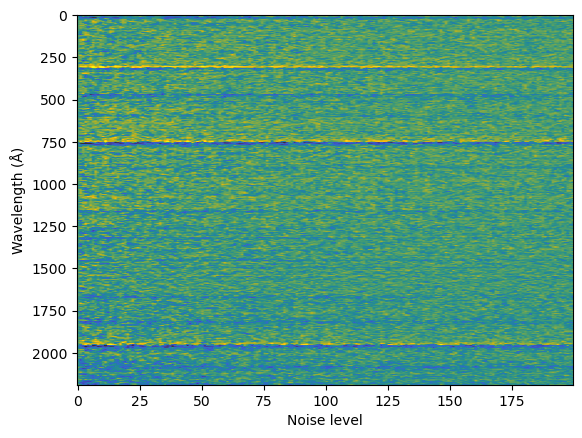

PyObject Text(25.953125, 0.5, 'Wavelength (Å)')

In [31]:
fig = plt.figure()
ax = fig.add_subplot(1,1,1)

img = ax.imshow(μ_cd_down[:,1:200],
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-2,
    vmax=2,
    # extent=(minimum(noises), maximum(noises),maxw,minw),
    # extent=(0,size(sorted_residuals',2),maxw,minw),
)
plt.xlabel("Noise level")
plt.ylabel("Wavelength (Å)")

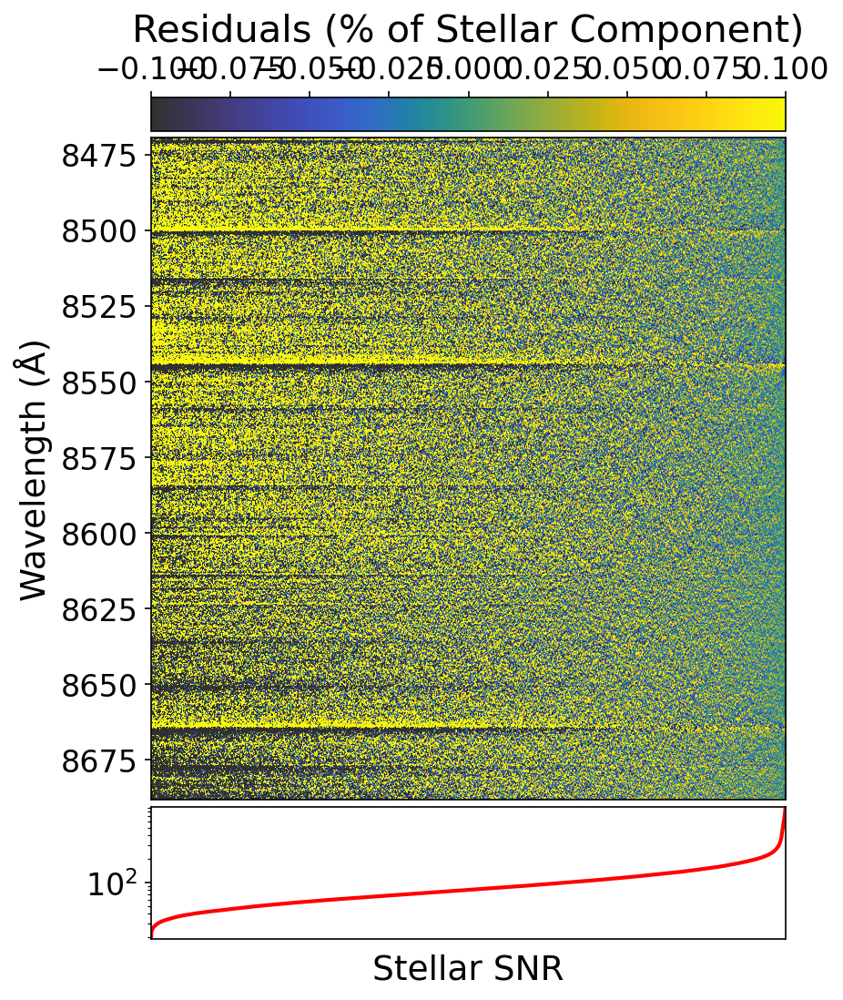

In [133]:
fs = 18

fig = plt.figure(figsize=(6,8),dpi=150)
nbin = 101
ax = fig.add_subplot(1,1,1)
img = ax.imshow(μ_cd_down[:,2:end-1],
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-0.1,
    vmax=0.1,
    extent=(0,size(μ_cd_down,2)),
)

ax.set_xticks([])

plt.xticks(fontsize=fs-2)
plt.yticks(fontsize=fs-2);

ax.set_ylabel("Wavelength (Å)",fontsize=fs)

divider = mpltk.make_axes_locatable(ax)
cax = divider.append_axes("top", size="5%", pad=0.05)
cbar = plt.colorbar(img, cax=cax, orientation="horizontal")
cax.xaxis.set_ticks_position("top")
cax.xaxis.set_label_position("top")
cax.set_xlabel("Residuals (% of Stellar Component)",fontsize=fs+2,labelpad=7)

plt.xticks(fontsize=fs-2)
plt.yticks(fontsize=fs-2);

cax1 = divider.append_axes("bottom", size="20%", pad=0.05)
data = stellar_SNR[2:end-1]
cax1.plot(data,color="red",lw=2)
cax1.set_ylim(minimum(data),maximum(data))
cax1.set_xlim(0,length(data))
cax1.set_xticks([])
cax1.set_yscale("log")
cax1.set_xlabel("Stellar SNR",fontsize=fs)

plt.xticks(fontsize=fs-2)
plt.yticks(fontsize=fs-2);

In [25]:
median
(μ_bd_sort)

0.0992133372854841

In [15]:
size(μ_cd_sort), size(μ_bd_sort)

((2189, 65186), (2189, 65186))

In [16]:
size(star_msk), size(msk_inter)

((2401,), (999645,))

In [17]:
size(μ_cd_mat[star_msk,msk_inter])

(2189, 65186)

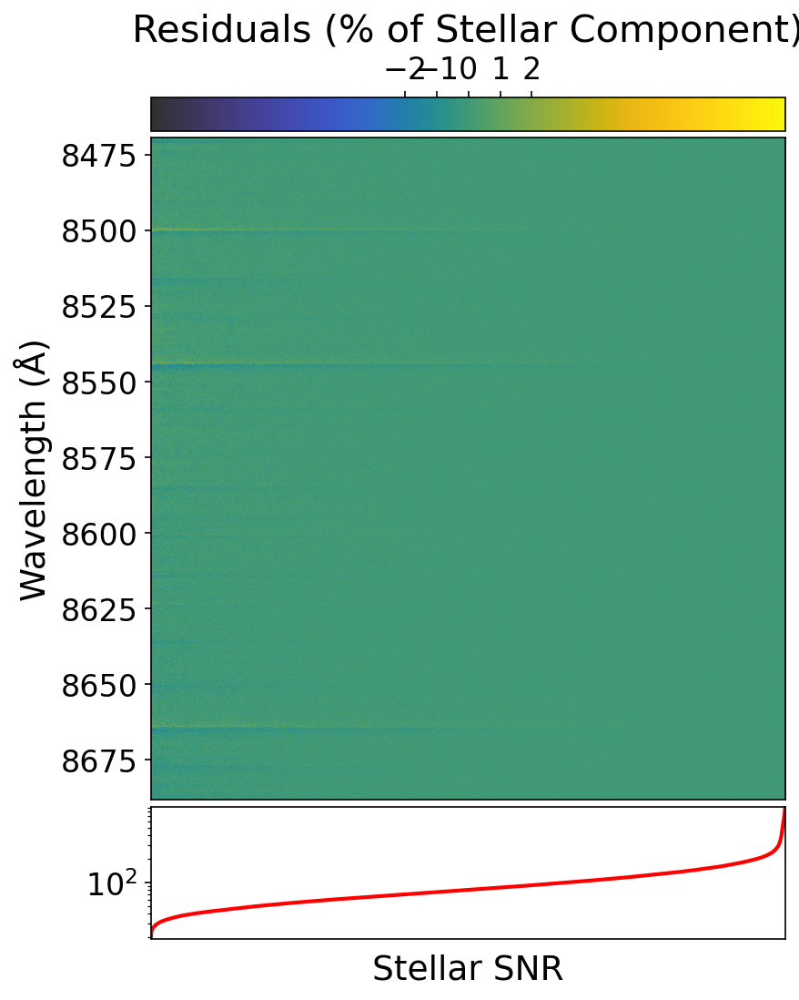

In [32]:
fs = 18

fig = plt.figure(figsize=(6,8),dpi=150)
nbin = 101
ax = fig.add_subplot(1,1,1)
img = ax.imshow(μ_cd_down[:,2:end-1],
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-10,
    vmax=10,
    extent=(0,size(μ_cd_down,2),maxw,minw),
)

ax.set_xticks([])

plt.xticks(fontsize=fs-2)
plt.yticks(fontsize=fs-2);

ax.set_ylabel("Wavelength (Å)",fontsize=fs)

divider = mpltk.make_axes_locatable(ax)
cax = divider.append_axes("top", size="5%", pad=0.05)
cbar = plt.colorbar(img, cax=cax, orientation="horizontal",ticks=[-2,-1,0,1,2])
cax.xaxis.set_ticks_position("top")
cax.xaxis.set_label_position("top")
cax.set_xlabel("Residuals (% of Stellar Component)",fontsize=fs+2,labelpad=7)

plt.xticks(fontsize=fs-2)
plt.yticks(fontsize=fs-2);

cax1 = divider.append_axes("bottom", size="20%", pad=0.05)
data = stellar_SNR[2:end-1]
cax1.plot(data,color="red",lw=2)
cax1.set_ylim(minimum(data),maximum(data))
cax1.set_xlim(0,length(data))
cax1.set_xticks([])
cax1.set_yscale("log")
cax1.set_xlabel("Stellar SNR",fontsize=fs)

plt.xticks(fontsize=fs-2)
plt.yticks(fontsize=fs-2);

In [28]:
sorted_SNRs = SNR_lst[msk_inter][ps1]
new_mask = sorted_SNRs .< 200;
# new_mask = sorted_SNRs[sorted_SNRs .< 200][1:20:end]

In [29]:
size(ps1)

(65186,)

In [34]:
new_μ_cd = μ_cd_mat[star_msk,msk_inter][:,ps1][:,new_mask]
new_μ_bd = μ_bd_mat[star_msk,msk_inter][:,ps1][:,new_mask]
new_snrs = sorted_SNRs[new_mask]
# new_snrs = sorted_SNRs[new_mask][1:20:end]
new_residuals = 100 .*new_μ_cd./new_μ_bd

println(size(new_residuals), size(new_snrs))

(2189, 62181)(62181,)


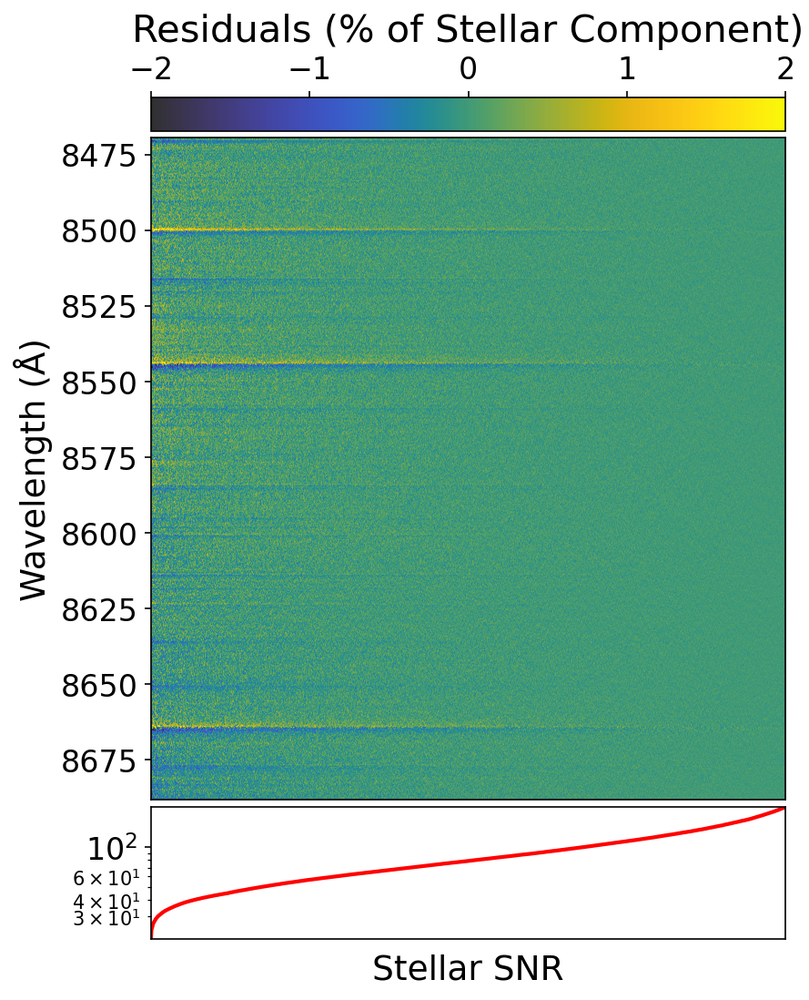

In [40]:
fs = 18

fig = plt.figure(figsize=(6,8),dpi=150)
nbin = 101
ax = fig.add_subplot(1,1,1)
img = ax.imshow(new_residuals,
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-2,
    vmax=2,
    extent=(0,size(new_μ_cd,2),maxw,minw),
)

ax.set_xticks([])

plt.xticks(fontsize=fs-2)
plt.yticks(fontsize=fs-2);

ax.set_ylabel("Wavelength (Å)",fontsize=fs)

divider = mpltk.make_axes_locatable(ax)
cax = divider.append_axes("top", size="5%", pad=0.05)
cbar = plt.colorbar(img, cax=cax, orientation="horizontal",ticks=[-2,-1,0,1,2])
cax.xaxis.set_ticks_position("top")
cax.xaxis.set_label_position("top")
cax.set_xlabel("Residuals (% of Stellar Component)",fontsize=fs+2,labelpad=7)

plt.xticks(fontsize=fs-2)
plt.yticks(fontsize=fs-2);

cax1 = divider.append_axes("bottom", size="20%", pad=0.05)
data = new_snrs
cax1.plot(data,color="red",lw=2)
cax1.set_ylim(minimum(data),maximum(data))
cax1.set_xlim(0,length(data))
cax1.set_xticks([])
cax1.set_yscale("log")
cax1.set_xlabel("Stellar SNR",fontsize=fs)

plt.xticks(fontsize=fs-2)
plt.yticks(fontsize=fs-2);

(2189, 3110)

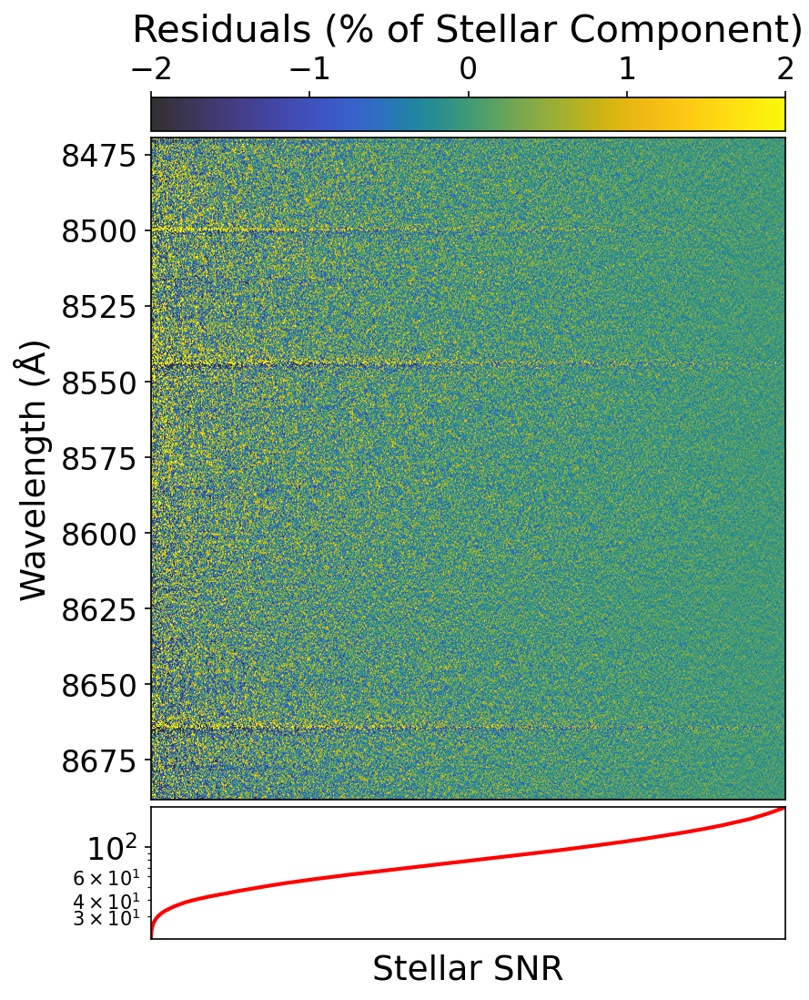

In [41]:
fs = 18

fig = plt.figure(figsize=(6,8),dpi=150)
nbin = 101
ax = fig.add_subplot(1,1,1)
img = ax.imshow(new_residuals[:,1:20:end],
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-2,
    vmax=2,
    extent=(0,size(new_μ_cd[:,1:20:end],2),maxw,minw),
)

print(size(new_residuals[:,1:20:end]))
ax.set_xticks([])

plt.xticks(fontsize=fs-2)
plt.yticks(fontsize=fs-2);

ax.set_ylabel("Wavelength (Å)",fontsize=fs)

divider = mpltk.make_axes_locatable(ax)
cax = divider.append_axes("top", size="5%", pad=0.05)
cbar = plt.colorbar(img, cax=cax, orientation="horizontal",ticks=[-2,-1,0,1,2])
cax.xaxis.set_ticks_position("top")
cax.xaxis.set_label_position("top")
cax.set_xlabel("Residuals (% of Stellar Component)",fontsize=fs+2,labelpad=7)

plt.xticks(fontsize=fs-2)
plt.yticks(fontsize=fs-2);

cax1 = divider.append_axes("bottom", size="20%", pad=0.05)
data = new_snrs[1:20:end]
cax1.plot(data,color="red",lw=2)
cax1.set_ylim(minimum(data),maximum(data))
cax1.set_xlim(0,length(data))
cax1.set_xticks([])
cax1.set_yscale("log")
cax1.set_xlabel("Stellar SNR",fontsize=fs)

plt.xticks(fontsize=fs-2)
plt.yticks(fontsize=fs-2);

## Testing re-binning

(2189, 2039)
(2189, 65186)
Original size:(2189, 65186)
(275, 65186)
(138, 4076)


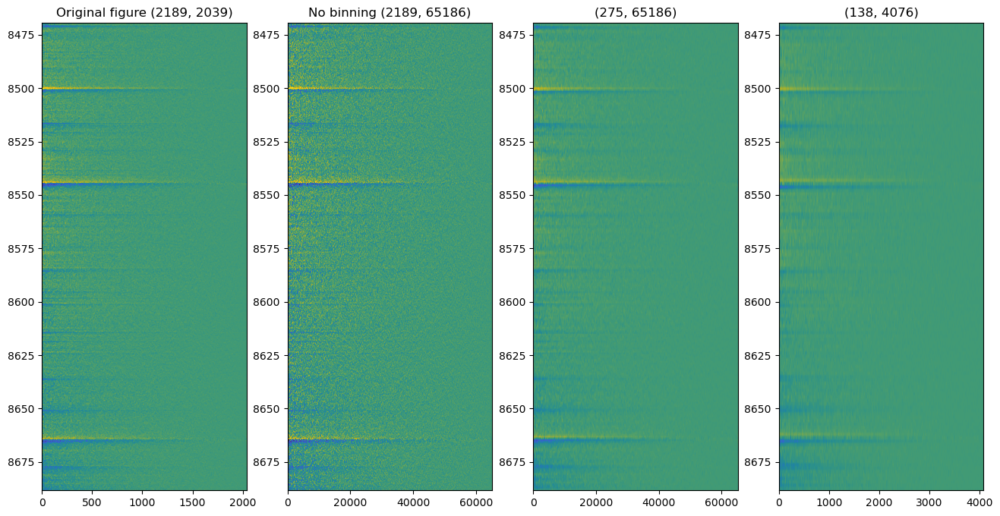

PyObject Text(0.5, 1.0, '(138, 4076)')

In [29]:
μ_cd_down = restrict(restrict(restrict(restrict(restrict(100 .*μ_cd_sort./μ_bd_sort,2),2),2),2),2)
println(size(μ_cd_down))


# stellar_SNR = restrict(restrict(restrict(restrict(restrict(SNR_lst[msk_inter][ps1])))));
fs = 18

fig, ax = plt.subplots(1,4, figsize = (16, 8))
img1 = ax[1].imshow(μ_cd_down[:,2:end-1],
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-2,
    vmax=2,
    extent=(0,size(μ_cd_down,2),maxw,minw),
)
ax[1].set_title("Original figure (2189, 2039)")


μ_cd_down1 = 100 .*μ_cd_sort./μ_bd_sort

println(size(μ_cd_down1))

img2 = ax[2].imshow(μ_cd_down1[:,2:end-1],
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-2,
    vmax=2,
    extent=(0,size(μ_cd_down1,2),maxw,minw),
)
ax[2].set_title("No binning (2189, 65186)")

println("Original size:", size((100 .*μ_cd_sort./μ_bd_sort)))

μ_cd_down2 = restrict(restrict(restrict(100 .*μ_cd_sort./μ_bd_sort,1),1),1)

println(size(μ_cd_down2))

img2 = ax[3].imshow(μ_cd_down2[:,2:end-1],
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-2,
    vmax=2,
    extent=(0,size(μ_cd_down2,2),maxw,minw),
)
ax[3].set_title("(275, 65186)")


μ_cd_down3 = restrict(restrict(restrict(restrict(100 .*μ_cd_sort./μ_bd_sort))))

println(size(μ_cd_down3))

img2 = ax[4].imshow(μ_cd_down3[:,2:end-1],
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-2,
    vmax=2,
    extent=(0,size(μ_cd_down3,2),maxw,minw),
)
ax[4].set_title("(138, 4076)")

## Removing masking

In [33]:
## This takes over a minute to run
full_exists = true
if full_exists
    ps1 = sortperm(SNR_lst);

    # μ_cd_mat = h5read(andrew_dir*"out/prod_wu_full/scan_μ_cd.h5","μ_cd");
    # μ_bd_mat = h5read(andrew_dir*"out/prod_wu_full/scan_μ_bd.h5","μ_bd");

    println(size(μ_cd_mat))
    ## Sort by SNR
    μ_cd_sort = μ_cd_mat[star_msk,:][:,ps1]; # residual
    μ_bd_sort = μ_bd_mat[star_msk,:][:,ps1]; # stellar component
    
    
    μ_cd_down = restrict(restrict(restrict(restrict(restrict(100 .*μ_cd_sort./μ_bd_sort,2),2),2),2),2);
    stellar_SNR = restrict(restrict(restrict(restrict(restrict(SNR_lst[ps1])))));
    # # μ_cd_down = restrict(100 .*μ_cd_sort./μ_bd_sort,2)
    # stellar_SNR = restrict(SNR_lst[msk_inter][ps1]);
    # # println(size(μ_cd_down))
    
#     h5write("../support/binned_resid.h5","μ_cd_down",μ_cd_down)
#     h5write("../support/binned_resid.h5","stellar_SNR",stellar_SNR)
end
;

(2401, 999645)


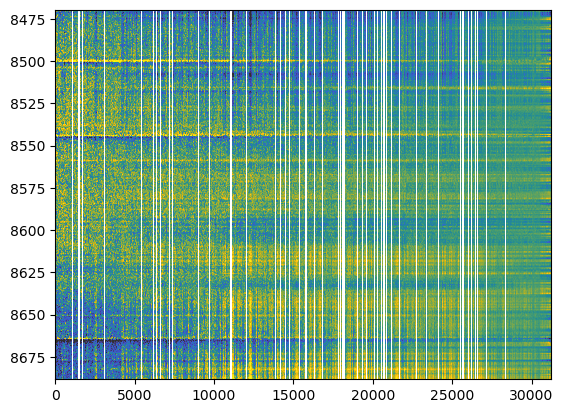

PyObject <matplotlib.image.AxesImage object at 0x14a749eb67d0>

In [37]:
## This takes almost 6 minutes to run
fig = plt.figure()
plt.imshow(restrict(100 .*μ_cd_sort./μ_bd_sort,2),
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-2,
    vmax=2,
    extent=(0,size(μ_cd_down,2),maxw,minw),
)

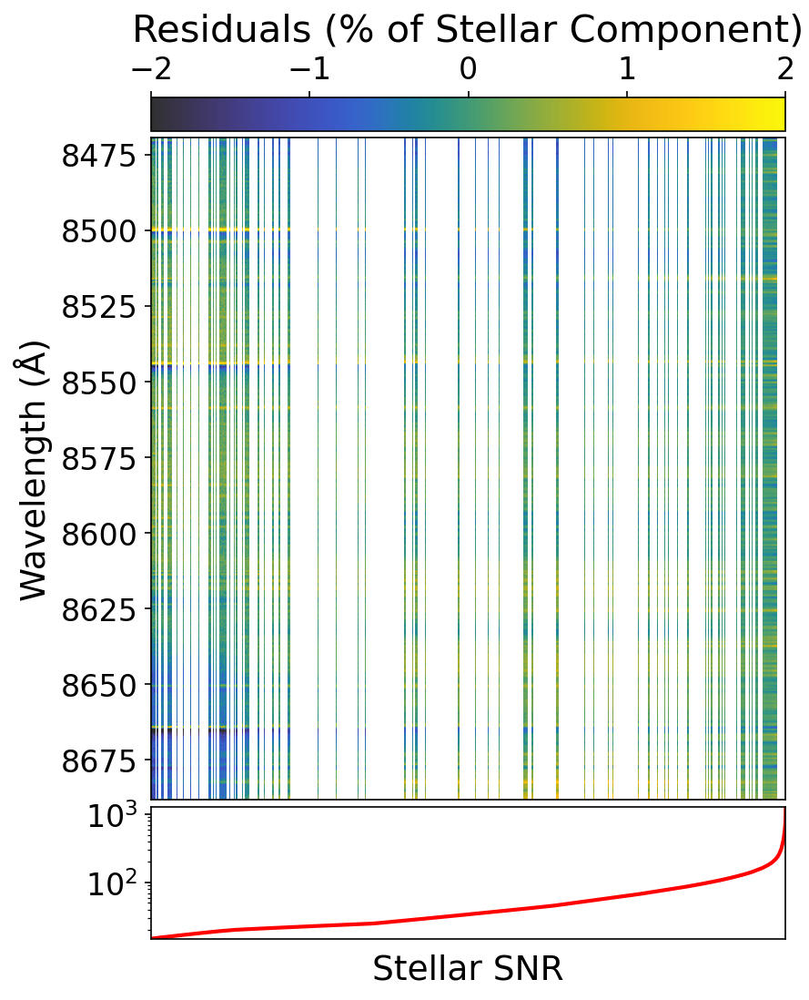

In [36]:
# fs = 18

# fig = plt.figure(figsize=(6,8),dpi=150)
# nbin = 101
# ax = fig.add_subplot(1,1,1)
# img = ax.imshow(μ_cd_down[:,2:end-1],
#     cmap="cet_gouldian",
#     aspect="auto",
#     vmin=-2,
#     vmax=2,
#     extent=(0,size(μ_cd_down,2),maxw,minw),
# )

# ax.set_xticks([])

# plt.xticks(fontsize=fs-2)
# plt.yticks(fontsize=fs-2);

# ax.set_ylabel("Wavelength (Å)",fontsize=fs)

# divider = mpltk.make_axes_locatable(ax)
# cax = divider.append_axes("top", size="5%", pad=0.05)
# cbar = plt.colorbar(img, cax=cax, orientation="horizontal",ticks=[-2,-1,0,1,2])
# cax.xaxis.set_ticks_position("top")
# cax.xaxis.set_label_position("top")
# cax.set_xlabel("Residuals (% of Stellar Component)",fontsize=fs+2,labelpad=7)

# plt.xticks(fontsize=fs-2)
# plt.yticks(fontsize=fs-2);

# cax1 = divider.append_axes("bottom", size="20%", pad=0.05)
# data = stellar_SNR[2:end-1]
# cax1.plot(data,color="red",lw=2)
# cax1.set_ylim(minimum(data),maximum(data))
# cax1.set_xlim(0,length(data))
# cax1.set_xticks([])
# cax1.set_yscale("log")
# cax1.set_xlabel("Stellar SNR",fontsize=fs)

# plt.xticks(fontsize=fs-2)
# plt.yticks(fontsize=fs-2);

## Testing the first batch

In [41]:
full_exists = true
if full_exists
    sort_SNR_mask = sortperm(SNR_lst[1:40]);
    
    μ_cd_mat_first_batch = h5read("../out_2/deblend_scan_0000003.h5","μ_cd");
    μ_bd_mat_first_batch = h5read("../out_2/deblend_scan_0000003.h5","μ_bd");

    println(size(μ_cd_mat_first_batch), " ", size(star_msk));
    
    # Mask based on stars we want and sort by SNR
    μ_cd_sort_first_batch = μ_cd_mat_first_batch[star_msk,:][:,sort_SNR_mask];
    μ_bd_sort_first_batch = μ_bd_mat_first_batch[star_msk,:][:,sort_SNR_mask];
        
    println(size(μ_cd_sort_first_batch), " ", size(μ_bd_sort_first_batch));
    
    # μ_cd_down = restrict(restrict(restrict(restrict(restrict(100 .*μ_cd_sort./μ_bd_sort,2),2),2),2),2)
    # stellar_SNR = restrict(restrict(restrict(restrict(restrict(SNR_lst[msk_inter][ps1])))));
    μ_cd_down_first_batch = 100 .*μ_cd_sort_first_batch./μ_bd_sort_first_batch
    # stellar_SNR = restrict(SNR_lst[msk_inter][ps1]);
    stellar_SNR_first_batch = SNR_lst[1:40][sort_SNR_mask]
    # println(size(μ_cd_down))
    
    println(size(stellar_SNR_first_batch))
#     h5write("../support/binned_resid.h5","μ_cd_down",μ_cd_down)
#     h5write("../support/binned_resid.h5","stellar_SNR",stellar_SNR)
end

# println(size(μ_cd_down))

# μ_cd_down = h5read("../support/binned_resid.h5","μ_cd_down")
# stellar_SNR = h5read("../support/binned_resid.h5","stellar_SNR");
;

(2401, 40) (2401,)
(2189, 40) (2189, 40)
(40,)


In [42]:
μ_cd_down_first_batch;

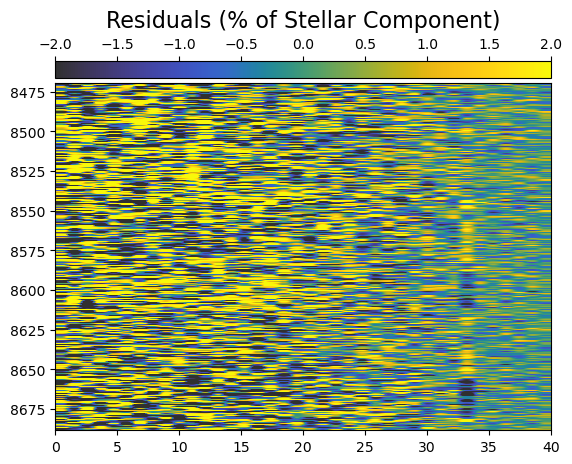

In [43]:
fig = plt.figure()
ax = fig.add_subplot(1,1,1)

img = ax.imshow(μ_cd_down_first_batch[:,2:end-1],
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-2,
    vmax=2,
    extent=(0,size(μ_cd_down_first_batch,2),maxw,minw),
)

divider = mpltk.make_axes_locatable(ax)
cax = divider.append_axes("top", size="5%", pad=0.05)
cbar = plt.colorbar(img, cax=cax, orientation="horizontal")
cax.xaxis.set_ticks_position("top")
cax.xaxis.set_label_position("top")
cax.set_xlabel("Residuals (% of Stellar Component)",fontsize=14+2,labelpad=7)
plt.show()

In [39]:
sort_SNR_mask = sortperm(SNR_lst[1:40]);

μ_cd_mat_first_batch = h5read("../out_2/deblend_scan_0000002.h5","μ_cd0");
μ_bd_mat_first_batch = h5read("../out_2/deblend_scan_0000002.h5","μ_bd0");

println(size(μ_cd_mat_first_batch), " ", size(star_msk));

# Mask based on stars we want and sort by SNR
μ_cd_sort_first_batch = μ_cd_mat_first_batch[star_msk,:][:,sort_SNR_mask];
μ_bd_sort_first_batch = μ_bd_mat_first_batch[star_msk,:][:,sort_SNR_mask];

println(size(μ_cd_sort_first_batch), " ", size(μ_bd_sort_first_batch));


μ_cd_down_first_batch = 100 .*μ_cd_sort_first_batch./μ_bd_sort_first_batch
stellar_SNR_first_batch = SNR_lst[1:40][sort_SNR_mask]
# println(size(μ_cd_down))

println(size(stellar_SNR_first_batch))


(2401, 40) (2401,)
(2189, 40) (2189, 40)
(40,)


These are with dust_on = False

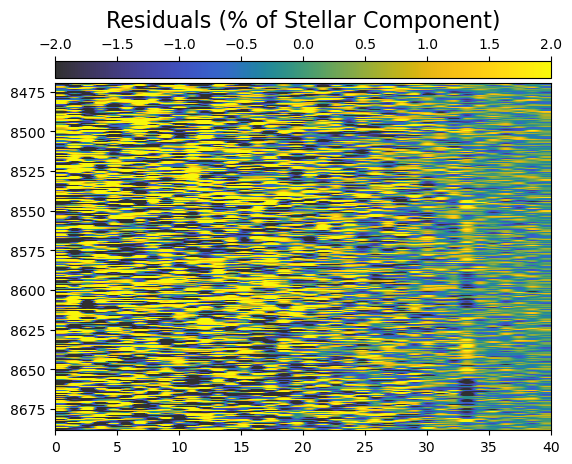

In [40]:
fig = plt.figure()
ax = fig.add_subplot(1,1,1)

img = ax.imshow(μ_cd_down_first_batch[:,2:end-1],
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-2,
    vmax=2,
    extent=(0,size(μ_cd_down_first_batch,2),maxw,minw),
)

divider = mpltk.make_axes_locatable(ax)
cax = divider.append_axes("top", size="5%", pad=0.05)
cbar = plt.colorbar(img, cax=cax, orientation="horizontal")
cax.xaxis.set_ticks_position("top")
cax.xaxis.set_label_position("top")
cax.set_xlabel("Residuals (% of Stellar Component)",fontsize=14+2,labelpad=7)
plt.show()

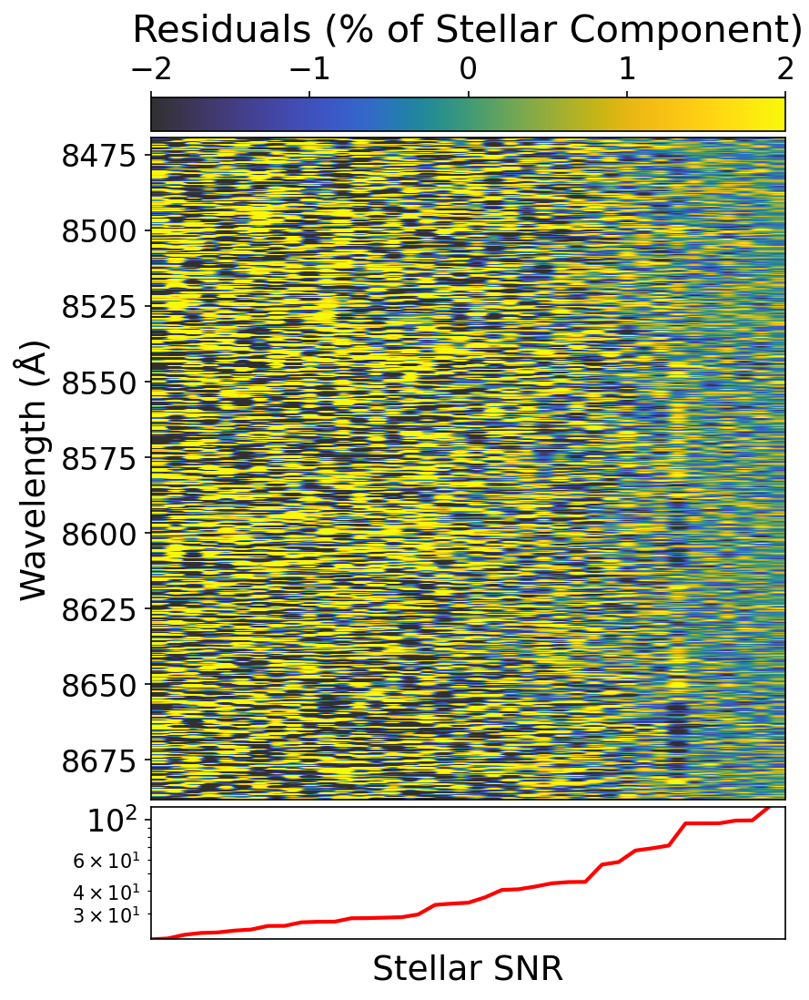

In [27]:
fs = 18

fig = plt.figure(figsize=(6,8),dpi=150)
nbin = 101
ax = fig.add_subplot(1,1,1)
img = ax.imshow(μ_cd_down_first_batch[:,2:end-1],
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-2,
    vmax=2,
    extent=(0,size(μ_cd_down,2),maxw,minw),
)

ax.set_xticks([])

plt.xticks(fontsize=fs-2)
plt.yticks(fontsize=fs-2);

ax.set_ylabel("Wavelength (Å)",fontsize=fs)

divider = mpltk.make_axes_locatable(ax)
cax = divider.append_axes("top", size="5%", pad=0.05)
cbar = plt.colorbar(img, cax=cax, orientation="horizontal",ticks=[-2,-1,0,1,2])
cax.xaxis.set_ticks_position("top")
cax.xaxis.set_label_position("top")
cax.set_xlabel("Residuals (% of Stellar Component)",fontsize=fs+2,labelpad=7)

plt.xticks(fontsize=fs-2)
plt.yticks(fontsize=fs-2);

cax1 = divider.append_axes("bottom", size="20%", pad=0.05)
data = stellar_SNR_first_batch[2:end-1]
cax1.plot(data,color="red",lw=2)
cax1.set_ylim(minimum(data),maximum(data))
cax1.set_xlim(0,length(data))
cax1.set_xticks([])
cax1.set_yscale("log")
cax1.set_xlabel("Stellar SNR",fontsize=fs)

plt.xticks(fontsize=fs-2)
plt.yticks(fontsize=fs-2);

(2189, 40)
(2189, 21)
Original size:(2189, 40)
(2189, 11)


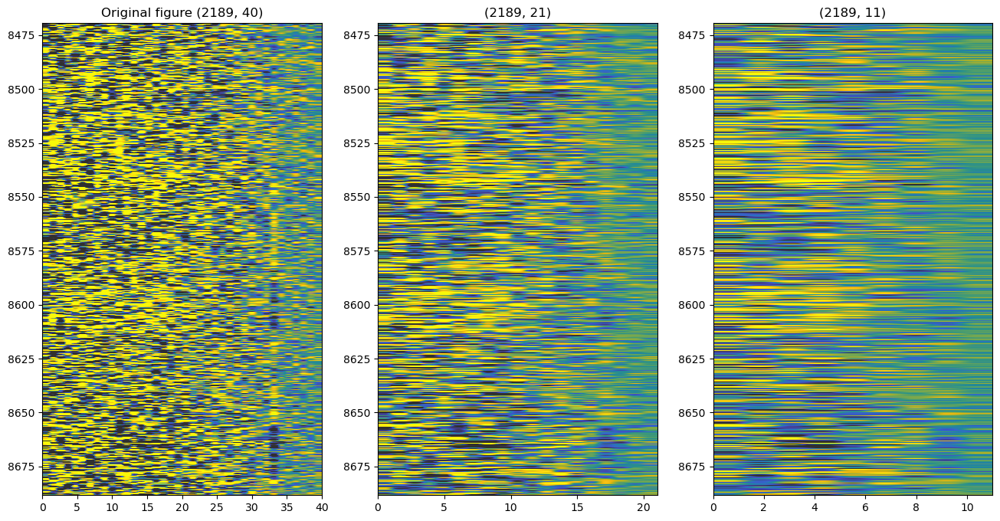

PyObject Text(0.5, 1.0, '(2189, 11)')

In [37]:
μ_cd_down1 = restrict(100 .*μ_cd_sort_first_batch./μ_bd_sort_first_batch,2)

μ_cd_down = 100 .*μ_cd_sort_first_batch./μ_bd_sort_first_batch
println(size(μ_cd_down))


# stellar_SNR = restrict(restrict(restrict(restrict(restrict(SNR_lst[msk_inter][ps1])))));
fs = 18

fig, ax = plt.subplots(1,3, figsize = (16, 8))
img1 = ax[1].imshow(μ_cd_down[:,2:end-1],
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-2,
    vmax=2,
    extent=(0,size(μ_cd_down,2),maxw,minw),
)
ax[1].set_title("Original figure (2189, 40)")



println(size(μ_cd_down1))

img2 = ax[2].imshow(μ_cd_down1[:,2:end-1],
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-2,
    vmax=2,
    extent=(0,size(μ_cd_down1,2),maxw,minw),
)
ax[2].set_title("(2189, 21)")

println("Original size:", size((100 .*μ_cd_sort_first_batch./μ_bd_sort_first_batch)))

μ_cd_down2 = restrict(restrict(100 .*μ_cd_sort_first_batch./μ_bd_sort_first_batch,2),2)

println(size(μ_cd_down2))

img2 = ax[3].imshow(μ_cd_down2[:,2:end-1],
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-2,
    vmax=2,
    extent=(0,size(μ_cd_down2,2),maxw,minw),
)
ax[3].set_title("(2189, 11)")


# μ_cd_down3 = restrict(restrict(restrict(restrict(100 .*μ_cd_sort_first_batch./μ_bd_sort_first_batch)),2),2)

# println(size(μ_cd_down3))

# img2 = ax[4].imshow(μ_cd_down3[:,2:end-1],
#     cmap="cet_gouldian",
#     aspect="auto",
#     vmin=-2,
#     vmax=2,
#     extent=(0,size(μ_cd_down3,2),maxw,minw),
# )
# ax[4].set_title("(138, 4076)")

# colorbar(img2)

In [104]:
# include("random_draw_submit_anasofia.jl")

  Activating project at `/uufs/chpc.utah.edu/common/home/u6039752/scratch/julia_env/dibs`


hello from 1:notchpeak21


  Activating project at `/uufs/chpc.utah.edu/common/home/u6039752/scratch/julia_env/dibs`


Batches to Do: 2
Base.Iterators.PartitionIterator{UnitRange{Int64}}(1:80, 40)


In [105]:
batsz = 40
itarg = Iterators.partition(1:batsz,batsz);

In [108]:
# readCorrect_random(c[1])

0.005
0.00625
0.0075
0.00875
0.01
0.01125
0.0125
0.01375
0.015
0.01625
0.0175
0.01875
0.02
0.02125
0.0225
0.02375
0.025
0.02625
0.0275
0.02875
0.03
0.03125
0.0325
0.03375
0.035
0.03625
0.0375
0.03875
0.04
0.04125
0.0425
0.043750000000000004
0.045
0.04625
0.0475
0.04875
0.05
0.051250000000000004
0.0525
0.05375
hiyes


In [106]:
c = collect(itarg)
c[1]

1:40

In [43]:
full_exists = true
if full_exists
    # sort_SNR_mask = sortperm(SNR_lst[1:40]);
    
    μ_cd_mat_random = h5read("../out/deblend_scan_0000002.h5","μ_cd");
    μ_bd_mat_random = h5read("../out/deblend_scan_0000002.h5","μ_bd");

    println(size(μ_cd_mat_random), " ", size(star_msk));
    
#     # Mask based on stars we want and sort by SNR
    μ_cd_sort_random = μ_cd_mat_random[star_msk,:];
    μ_bd_sort_random = μ_bd_mat_random[star_msk,:];
    
    println(size(μ_cd_sort_random))
        
#     println(size(μ_cd_sort_random), " ", size(μ_bd_sort_random));
    
#     # μ_cd_down = restrict(restrict(restrict(restrict(restrict(100 .*μ_cd_sort./μ_bd_sort,2),2),2),2),2)
#     # stellar_SNR = restrict(restrict(restrict(restrict(restrict(SNR_lst[msk_inter][ps1])))));
    μ_cd_down_random = 100 .*μ_cd_sort_random./μ_bd_sort_random;
#     # stellar_SNR = restrict(SNR_lst[msk_inter][ps1]);
#     stellar_SNR_first_batch = SNR_lst[1:40][sort_SNR_mask]
#     # println(size(μ_cd_down))
    
#     println(size(stellar_SNR_first_batch))
#     h5write("../support/binned_resid.h5","μ_cd_down",μ_cd_down)
#     h5write("../support/binned_resid.h5","stellar_SNR",stellar_SNR)
end
;

(2401, 40) (2401,)
(2189, 40)


In [44]:
μ_cd_down_random

2189×40 Matrix{Float64}:
  -5.67412  -13.7853   5.13368   …   20.6205       7.89812     10.3913
  -2.2336   -35.2025   7.20257       17.5456       4.88205     79.5137
  -6.80071  -24.5889   1.7393        12.2487     -21.8359      -1.5971
  -9.8604    -8.52454  4.76568       -5.92423     36.2291      15.9345
 -10.3262     1.82245  4.23748       -4.936       32.6855      25.7699
  -8.58118  -21.5034   7.78692   …   -0.106189   -20.8022      12.9887
  -5.47626  -25.0179   4.19381        3.75086    -13.7561      23.8531
  -5.92633  -15.4845   4.19293       15.944       23.4964       8.62278
  -8.61008  -16.3186   4.51201      -11.9636      16.016       -1.99379
  -7.12269  -14.477    1.36795      -17.8673     -21.0612     -18.4416
  -5.83726  -33.4957   5.06268   …   23.3395      13.0339       3.70781
  -3.29966  -17.5994   4.3385        19.9522      16.0001     -38.3826
  -1.2238     7.41575  0.892711      -1.5059       0.0746986  -39.6637
   ⋮                             ⋱               

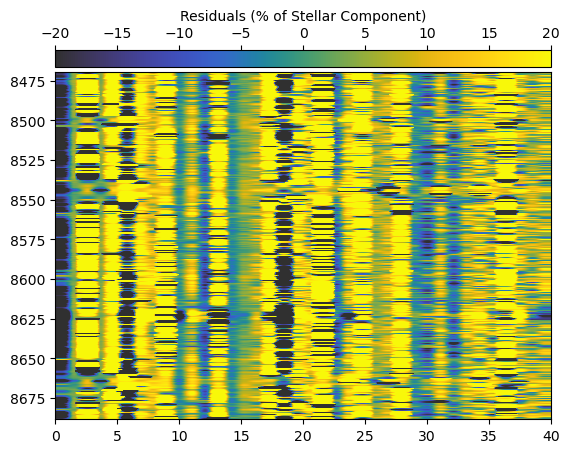

In [45]:
fig = plt.figure()
ax = fig.add_subplot(1,1,1)

img = ax.imshow(μ_cd_down_random[:,2:end-1],
    cmap="cet_gouldian",
    aspect="auto",
    vmin=-20,
    vmax=20,
    extent=(0,size(μ_cd_down_random,2),maxw,minw),
)
divider = mpltk.make_axes_locatable(ax)
cax = divider.append_axes("top", size="5%", pad=0.05)
cbar = plt.colorbar(img, cax=cax, orientation="horizontal")
cax.xaxis.set_ticks_position("top")
cax.xaxis.set_label_position("top")
cax.set_xlabel("Residuals (% of Stellar Component)")
plt.show()

This is not ordered by SNR, need to figure out how to calculate that for random draws from the prior. Also, need to filter for random draws with only absorption lines.

Doug said to try to examine which gspec flags individually are making the difference

Make the fake data in the script using star, DIB, and random noise. Vary random noise factors between 0.005 and 0.05 ish, then use that as proxy for SNR to order fake stars.

Try to first remove the looping in the submit script since we're fixing the sigma, etc in the DIB (only keep decomposition part of script).